# Read data

Считываем скачанные с помощью брокера ANTARES кривые блеска ZTF: https://noao.gitlab.io/antares/client/api.html

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm
from tqdm.auto import tqdm
import utils
from utils import regression_quality_metrics_report
from sklearn.model_selection import train_test_split
import gp_aug
from gp_aug import GaussianProcessesAugmentation


path = '/home/masha/AstroAugumetation/ANTARES/'
path_to = "/home/masha/AstroAugumetation/ZTF_BTS_02_02__02_04_2021.csv"


calculate_flux = lambda x: 10**((x + 48.6) / -2.5)


bts = pd.read_csv(path_to, sep =',')
bts = bts.drop('Unnamed: 0', 1) 


data = []
new_bts_id = []
for ztf_id in tqdm(bts['ZTFID'].values):
    try:
        df = pd.read_csv(path + ztf_id + '.csv')
        if df.index.values.shape[0] != 0:
            df = df.drop('Unnamed: 0', 1)
            mask_g = df[df['ant_passband'] == 'g'].index.shape[0] > 10
            mask_r = df[df['ant_passband'] == 'R'].index.shape[0] > 10
            if (mask_g)&(mask_r):
                df = df[df['ant_passband'] != 'i']
                df['ant_mag'] = 1e26*df['ant_mag'].map(calculate_flux) #* 1e26 # переводим в потоки в [мЯн]
                df['ant_magerr'] = 1.086*df['ant_magerr']*df['ant_mag']
                df['ant_passband'][df['ant_passband'] == 'g'] = 0
                df['ant_passband'][df['ant_passband'] == 'R'] = 1
                df.rename(columns={"ant_mjd": "mjd","ant_mag": "flux", \
                                   "ant_magerr": "flux_err", "ant_passband": "passband"},
                          inplace=True)
                data.append(df)
                new_bts_id.append(ztf_id)
    except FileNotFoundError:
        continue

print(len(data), len(new_bts_id))

  0%|          | 0/2736 [00:00<?, ?it/s]

<ipython-input-1-5ad6e0a68ebe>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ant_passband'][df['ant_passband'] == 'g'] = 0
<ipython-input-1-5ad6e0a68ebe>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ant_passband'][df['ant_passband'] == 'R'] = 1


1403 1403


In [2]:
bts

,ZTFID,IAUID,discdate,RA,Dec,peakt,peakfilt,peakmag,peakabs,duration,rise,fade,type,redshift,hostabs,hostcol,b,A_V
0,ZTF18aaqedfj,SN2018bff,2018-04-23 11:26:52.000,13:45:25.21,+26:25:27.2,242.77,r,18.1144,-19.09,27.8,4.738,23.062,SN Ia,0.0623,-19.90,0.96,77.936810,0.040
1,ZTF18aarbgdn,SN2018bfh,2018-05-06 03:50:24.000,10:22:41.10,+15:56:20.8,245.65,r,17.2666,-19.22,>16.002,3.922,>12.08,SN Ia,0.044,-22.20,0.97,53.801429,0.096
2,ZTF18aajpjdi,SN2018bfx,2018-04-14 07:24:57.000,13:18:06.62,+27:52:24.2,245.71,r,18.4652,-19.13,39.856,18.904,20.952,SN Ia,0.0746,-20.07,0.53,84.039406,0.040
3,ZTF18aaqjovh,SN2018bvw,2018-05-05 04:04:48.000,11:52:43.61,+25:40:30.1,248.74,r,18.3077,-18.58,25.566,8.684,16.882,SN Ic-BL,0.054,-19.99,0.62,76.780820,0.044
4,ZTF18aatlfus,SN2018clq,2018-06-08 12:15:50.000,17:08:42.33,+28:31:14.1,252.92,g,18.3244,-18.39,23.432,4.13,19.302,SN IIP,0.0451,-21.47,0.82,33.822947,0.213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2731,ZTF21aaopqqk,SN2021gbq,2021-03-07 09:50:24.000,18:41:50.46,+61:15:23.1,1292.01,g,18.2948,-19.30,20.285,8.549,11.736,SN Ia,0.0705,-19.00,0.60,24.690561,0.128
2732,ZTF21aaocrlm,SN2021epp,2021-03-05 04:30:27.000,08:10:55.27,-06:02:49.3,1292.69,r,18.8046,-17.43,>24.583,13.533,>11.05,SN Ic-BL,0.0385,-20.18,0.56,14.642573,0.150
2733,ZTF21aaovdlh,AT2021fck,2021-03-05 04:05:27.001,08:41:22.68,+02:53:23.3,1293.65,g,17.8715,-19.16,>16.227,6.137,>10.09,SN Ia,0.056,-17.72,0.49,25.671500,0.084
2734,ZTF21aaodljj,AT2021epq,2021-03-05 04:11:15.996,08:36:28.83,+74:09:58.9,1293.66,g,17.6395,-19.22,>18.083,9.013,>9.07,SN Ia,0.053,-19.83,0.87,33.101619,0.043


In [3]:
data[1]

,mjd,passband,flux,flux_err
0,58245.171447,1,0.165105,0.003805
1,58248.236250,1,0.172552,0.004060
2,58254.192338,1,0.167788,0.005610
3,58257.233877,1,0.144730,0.006575
4,58266.250648,1,0.080316,0.012488
...,...,...,...,...
159,59292.297141,0,0.100622,0.006388
160,59295.278044,0,0.094563,0.011423
161,59297.241470,0,0.106525,0.010966
162,59302.353773,0,0.096587,0.014130


In [4]:
passband2lam  = {0: 0, 1: 1} # green, red 
color = {1: 'red', 0: 'green'}
data = np.array(data, dtype='object')
new_bts_id = np.array(new_bts_id, dtype='object')

In [5]:
def get_object(data, name_in_BTSdf):
    """data - """
    assert isinstance(name_in_BTSdf, str), 'Попробуйте ввести название объекта из ZTF'
    assert isinstance(data, np.ndarray), 'Маски будут работать неправильно, если это не numpy.ndarray'
    if name_in_BTSdf[:2] == 'ZT':
        assert np.any(new_bts_id == name_in_BTSdf), 'Среди отобранных объектов нет объекта с таким ID'
        df_num = data[np.where(new_bts_id == name_in_BTSdf)[0][0]]
        return df_num
    else:
        return None
get_object(data, 'ZTF17aaazdba')

,mjd,passband,flux,flux_err
0,58526.402512,0,0.150439,0.025164
1,58534.235081,0,0.973015,0.066525
2,58534.315694,1,0.896685,0.070020
3,58534.316146,1,0.678142,0.048938
4,58538.254491,0,1.657754,0.109956
...,...,...,...,...
107,58944.190845,0,0.083914,0.017225
108,59128.466933,0,0.104158,0.018072
109,59168.464861,0,0.079245,0.015223
110,59192.458276,1,0.455165,0.055905


In [6]:
data[np.where(new_bts_id == 'ZTF17aaazdba')[0][0]]

,mjd,passband,flux,flux_err
0,58526.402512,0,0.150439,0.025164
1,58534.235081,0,0.973015,0.066525
2,58534.315694,1,0.896685,0.070020
3,58534.316146,1,0.678142,0.048938
4,58538.254491,0,1.657754,0.109956
...,...,...,...,...
107,58944.190845,0,0.083914,0.017225
108,59128.466933,0,0.104158,0.018072
109,59168.464861,0,0.079245,0.015223
110,59192.458276,1,0.455165,0.055905


In [7]:
def get_passband(anobject, passband):
    light_curve = anobject[anobject.passband == passband]
    return light_curve

def compile_obj(t, flux, flux_err, passband):
    obj = pd.DataFrame()
    obj['mjd']      = t
    obj['flux']     = flux
    obj['flux_err'] = flux_err
    obj['passband'] = passband
    return obj

def is_good(anobject):
    good = 1
    count = 0
    for passband in range(2):
        if len(get_passband(anobject, passband)) < 10:
            count += 1
    if count > 0:
        good = 0
    # keep only objects without large breaks in observations
    anobject = anobject.sort_values('mjd')
    mjd = anobject['mjd'].values
    if np.diff(mjd, 1).max() > 1000:
        good = 0
    
    return good

def plot_light_curves(anobject, title=""):
    anobject = anobject.sort_values('mjd')
    plt.figure(figsize=(9, 4))
    for passband in range(2):
        light_curve = get_passband(anobject, passband)
        plt.errorbar(light_curve['mjd'].values, light_curve['flux'].values, \
                     yerr=light_curve['flux_err'].values, linewidth=0.5, \
                     marker='o', elinewidth=0.7 ,markersize=3.50, \
           markeredgecolor='black', markeredgewidth=0.50, \
                     fmt='o--', color=color[passband], label=color[passband][0])

    plt.xlabel('Modified Julian Date', size=14)
    plt.xticks(size=14)
    plt.ylabel('Flux [uJy]', size=14)
    plt.yticks(size=14)
    plt.grid()
    plt.legend(loc='best', ncol=3, fontsize=14)
    plt.title(title, size=14)

ZTF18aajpjdi


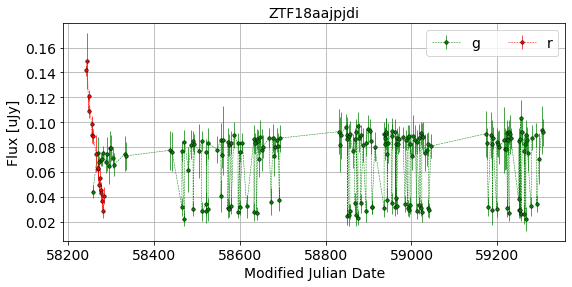

ZTF18aaqjovh


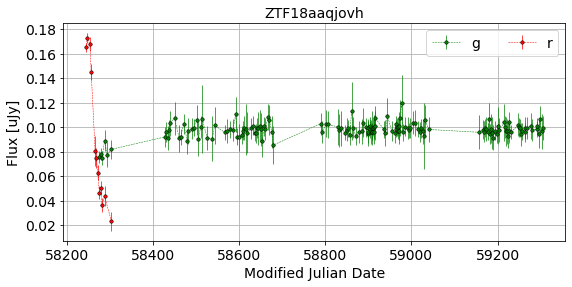

ZTF18aatlfus


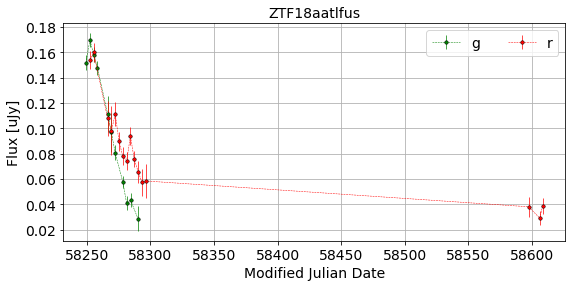

ZTF18aapictz


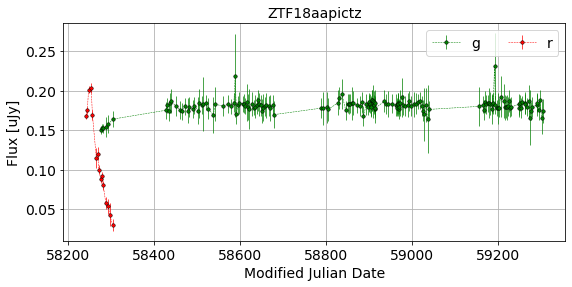

ZTF18aaqskoy


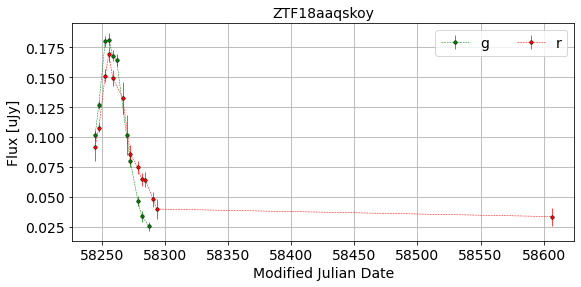

ZTF18aaumeys


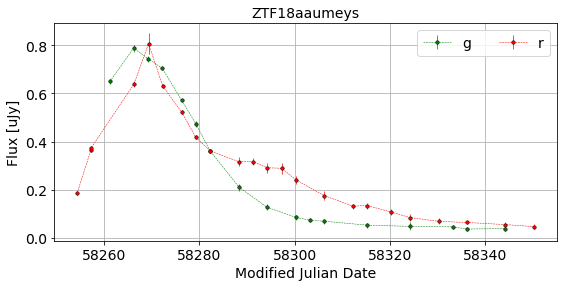

ZTF18aaqkoyr


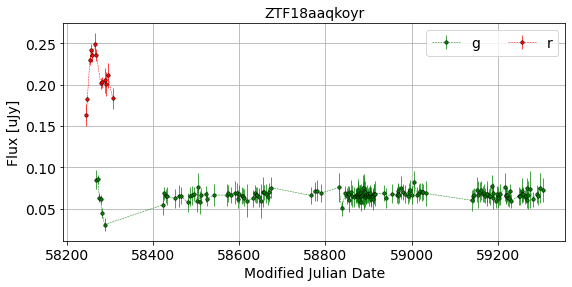

ZTF18aasxvsg


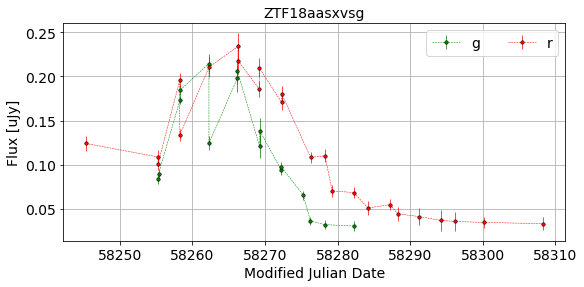

ZTF18aasdted


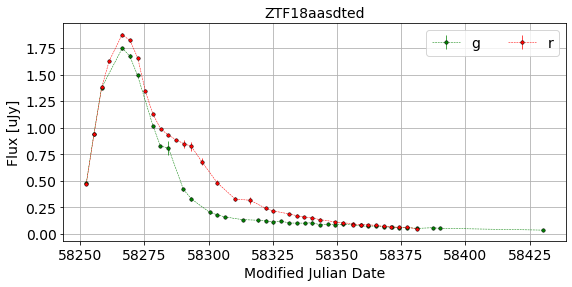

ZTF18aauizcr


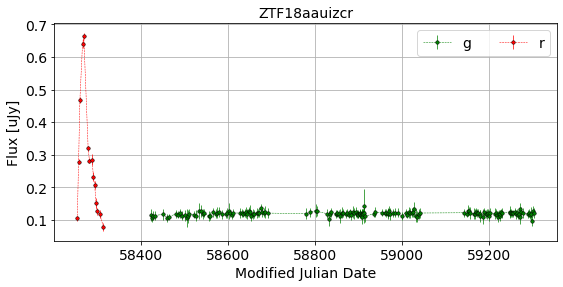

ZTF18aawyjjq


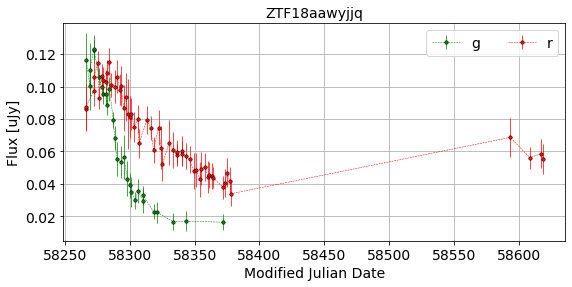

ZTF18aavrwhu


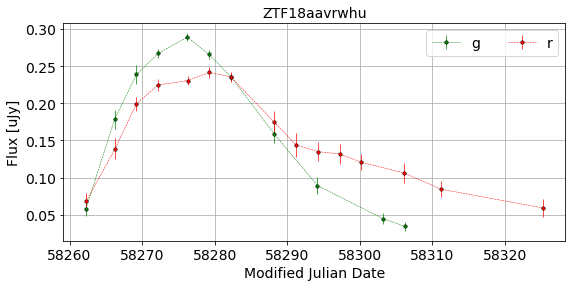

ZTF18aaxcntm


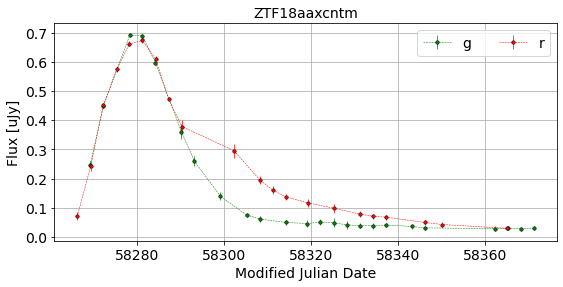

ZTF18aaxdrjn


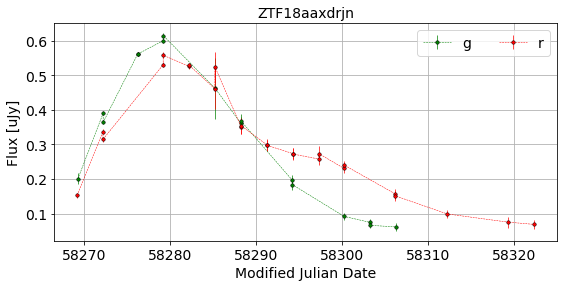

ZTF18aaxnqjb


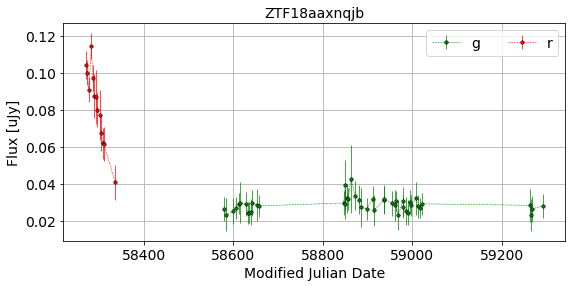

ZTF18aaxsioa


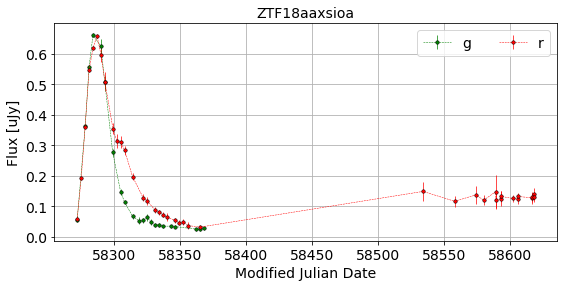

ZTF18aaxwjmp


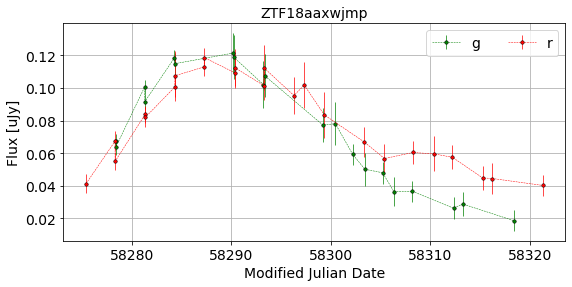

ZTF18aazblzy


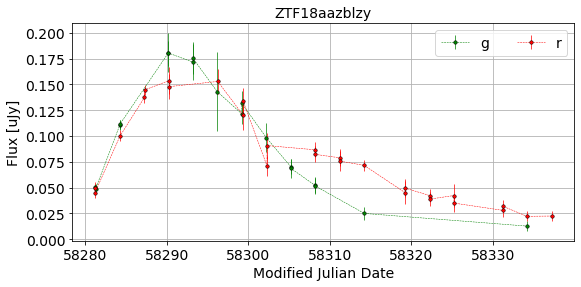

ZTF18aayjyub


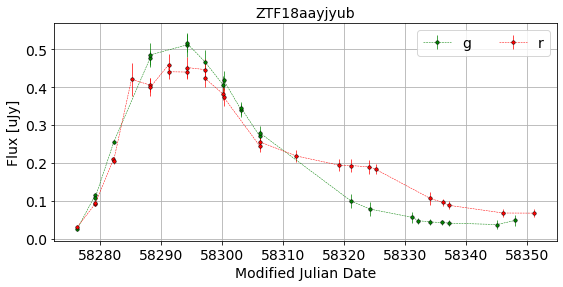

ZTF18aayjvve


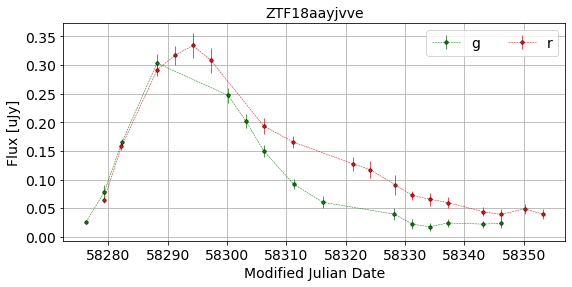

In [8]:
for name in new_bts_id[:20]:
    anobject = get_object(data, name)
    
    if not is_good(anobject): 
        continue
        
    print(name)
    
    plot_light_curves(anobject, name)
    plt.show()

# One-object test

(43, 4)


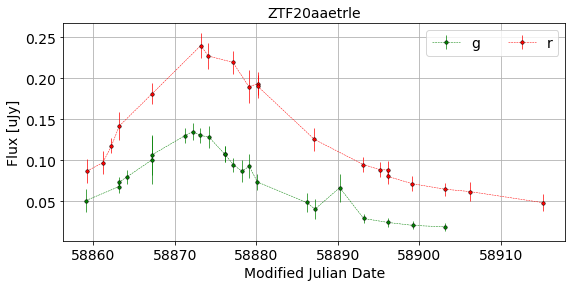

In [9]:
anobject = get_object(data, 'ZTF20aaetrle')
print(anobject.shape)
plot_light_curves(anobject, 'ZTF20aaetrle')

In [10]:
df_test = pd.read_csv(path + 'ZTF20aaetrle.csv')

In [11]:
df_test

,Unnamed: 0,ant_mjd,ant_passband,ant_mag,ant_magerr
0,23,58859.113785,g,19.632900,0.243986
1,24,58859.236065,R,19.054501,0.156061
2,26,58861.166331,R,18.931499,0.134085
3,27,58862.228958,R,18.725700,0.071706
4,28,58863.129630,g,19.322100,0.099737
5,29,58863.140324,g,19.239901,0.088114
6,30,58863.194190,R,18.520500,0.109761
7,31,58864.119086,g,19.147499,0.103737
8,32,58867.174745,g,18.896299,0.265654
9,33,58867.175197,g,18.832701,0.210664


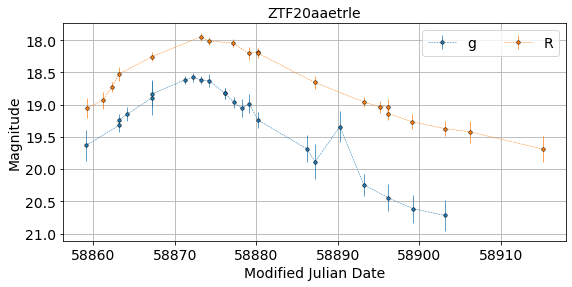

In [12]:
plt.figure(figsize=(9, 4))
for passband in ['g', 'R']:
    light_curve = df_test[df_test['ant_passband'] == passband]
    plt.errorbar(light_curve['ant_mjd'].values, light_curve['ant_mag'].values, \
                     yerr=light_curve['ant_magerr'].values, linewidth=0.5, \
                     marker='o', elinewidth=0.7 ,markersize=3.50, \
        markeredgecolor='black', markeredgewidth=0.50, \
                     fmt='o--', label=passband)

plt.xlabel('Modified Julian Date', size=14)
plt.xticks(size=14)
plt.ylabel('Magnitude', size=14)
plt.yticks(size=14)
plt.grid()
plt.legend(loc='best', ncol=3, fontsize=14)
plt.title('ZTF20aaetrle', size=14)
plt.gca().invert_yaxis()

## Для данного объекта была также получена кривая блеска из сервиса ForcedPhotometry ZTF 

http://web.ipac.caltech.edu/staff/fmasci/ztf/forcedphot.pdf


Можно заметить, что магнитуда пика не совпадает

<img src="AstroAugumetationZTF20aaetrle.png" style="height:450px">

Но если сравнивать с сервисом Lasair, на который ссылаются создатели каталога BTS, видно, что совпадает и вид и звездная величина пика, так что надеюсь в этот раз разметка правильная :)

https://lasair.roe.ac.uk/object/ZTF20aaetrle/

In [13]:
# fit augmentation model

def augum_gp(data, name, n_obs=2000):
    anobject = get_object(data, name)
        
    anobject_train, anobject_test = train_test_split(anobject, test_size=0.5, random_state=11)
    model = gp_aug.GaussianProcessesAugmentation(passband2lam)
    model.fit(anobject_train['mjd'].values, anobject_train['flux'].values, 
          anobject_train['flux_err'].values, anobject_train['passband'].values)

# predict flux for unseen observations
    flux_pred, flux_err_pred = model.predict(anobject_test['mjd'].values, \
                                        anobject_test.passband, copy=True)
    #print(anobject['mjd'].min(), anobject['mjd'].max())
# augmentation
    t_aug, flux_aug, flux_err_aug, passband_aug = model.augmentation(anobject['mjd'].min(), 
                                                                 anobject['mjd'].max(), n_obs=n_obs)

    anobject_test_pred = compile_obj(anobject_test['mjd'].values, flux_pred, 
                                  flux_err_pred, anobject_test['passband'].values)
    anobject_aug = compile_obj(t_aug, flux_aug, flux_err_aug, passband_aug)
    return anobject_test, anobject_test_pred, anobject_aug, flux_pred, anobject_train


obj_test, obj_test_pred, obj_aug, flux_pred, object_train = augum_gp(data, 'ZTF20aaetrle')

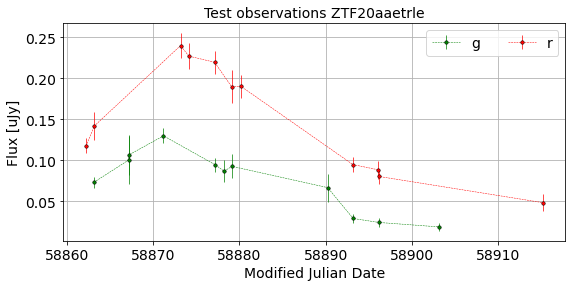

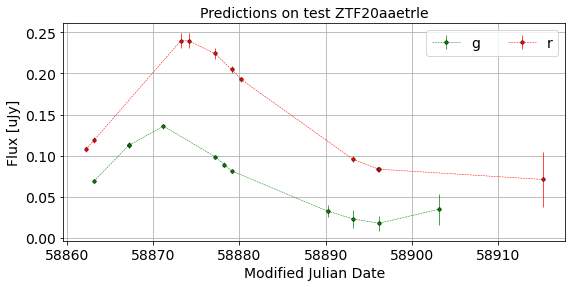

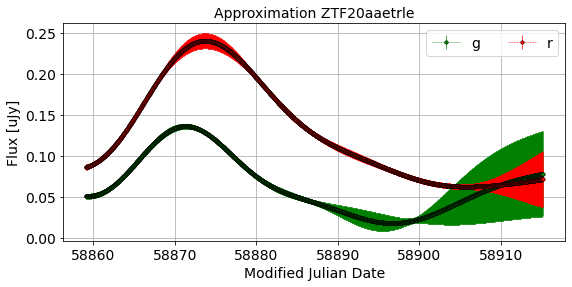

In [14]:
plot_light_curves(obj_test, "Test observations" + ' ZTF20aaetrle')
plot_light_curves(obj_test_pred, "Predictions on test" + ' ZTF20aaetrle')
plot_light_curves(obj_aug, "Approximation" + ' ZTF20aaetrle')

In [15]:
[rmse, mae, rse, rae, mape] = utils.regression_quality_metrics_report(obj_test['flux'].values, 
                                                                      obj_test_pred['flux'].values)
print("RMSE: ", rmse)
print("MAE: ", mae)
print("RSE: ", rse)
print("RAE: ", rae)
print("MAPE: ", mape)

RMSE:  0.012542231814548457
MAE:  0.009484541399797602
RSE:  0.19746766979743346
RAE:  0.1860096603016554
MAPE:  15.023511106541385


# Test on many object
## Построим сравнение апроксимации и точек наблюдений по фильтрам

In [16]:
def plot_light_curves_ax(anobject, ax, title=""):
    anobject = anobject.sort_values('mjd')
    for passband in range(2):
        light_curve = get_passband(anobject, passband)
        ax.errorbar(light_curve['mjd'].values, light_curve['flux'].values, \
                     yerr=light_curve['flux_err'].values, linewidth=1.5, \
                     marker='o', elinewidth=1.7 ,markersize=4.50, \
           markeredgecolor='black', markeredgewidth=1.50, \
                     fmt='o--', color=color[passband], label=color[passband][0])

    ax.set_xlabel('Modified Julian Date', size=30)
    ax.set_ylabel('Flux [uJy]', size=30)
    ax.grid(linewidth=2)
    ax.set_title(title, size=35)
    
def plot_light_curves_ax_band(anobject_test, anobject_train, anobject_approx, ax1, ax2, title=""):
    anobject_test = anobject_test.sort_values('mjd')
    anobject_train = anobject_train.sort_values('mjd')
    anobject_approx = anobject_approx.sort_values('mjd')
    for passband, ax in zip(range(2), [ax1, ax2]):
        light_curve_test = get_passband(anobject_test, passband)
        light_curve_train = get_passband(anobject_train, passband)
        light_curve_approx = get_passband(anobject_approx, passband)
        ax.plot(light_curve_approx['mjd'].values, light_curve_approx['flux'].values, \
                linewidth=5.5, color='black', label='approx flux', zorder=10)
        ax.errorbar(light_curve_test['mjd'].values, light_curve_test['flux'].values, \
                     yerr=light_curve_test['flux_err'].values, linewidth=3.5, \
                     marker='o', elinewidth=1.7 ,markersize=16.50, \
           markeredgecolor='black', markeredgewidth=1.50, \
                     fmt='.', color=color[passband], label=color[passband][0]+' test')
        ax.errorbar(light_curve_train['mjd'].values, light_curve_train['flux'].values, \
                     yerr=light_curve_train['flux_err'].values, linewidth=3.5, \
                     marker='^', elinewidth=1.7 ,markersize=14.50, \
           markeredgecolor='black', markeredgewidth=1.50, \
                     fmt='.', color=color[passband], label=color[passband][0]+' train')
        ax.fill_between(light_curve_approx['mjd'].values,\
                        light_curve_approx['flux'].values - light_curve_approx['flux_err'].values, \
                        light_curve_approx['flux'].values + light_curve_approx['flux_err'].values,
                 color='gray', alpha=0.2, label='approx sigma')
    ax1.set_xlabel('Modified Julian Date', size=30)
    ax1.set_ylabel('Flux [uJy]', size=30)
    ax1.grid(linewidth=2)
    ax1.set_title(title, size=35)
    ax2.set_xlabel('Modified Julian Date', size=30)
    ax2.set_ylabel('Flux [uJy]', size=30)
    ax2.grid(linewidth=2)
    ax2.set_title(title, size=35)

0it [00:00, ?it/s]

/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value found for "
/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value found for "
/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The opt

Среднее значение метрики RMSE 0.023
Медианное значение метрики RMSE 0.02
Минимальное значение метрики RMSE 0.004
Максимальное значение метрики RMSE 0.07

Среднее значение метрики MAE 0.015
Медианное значение метрики MAE 0.014
Минимальное значение метрики MAE 0.003
Максимальное значение метрики MAE 0.039

Среднее значение метрики RSE 0.339
Медианное значение метрики RSE 0.262
Минимальное значение метрики RSE 0.091
Максимальное значение метрики RSE 1.007

Среднее значение метрики RAE 0.316
Медианное значение метрики RAE 0.227
Минимальное значение метрики RAE 0.071
Максимальное значение метрики RAE 0.99

Среднее значение метрики MAPE 15.318
Медианное значение метрики MAPE 13.927
Минимальное значение метрики MAPE 3.142
Максимальное значение метрики MAPE 51.962



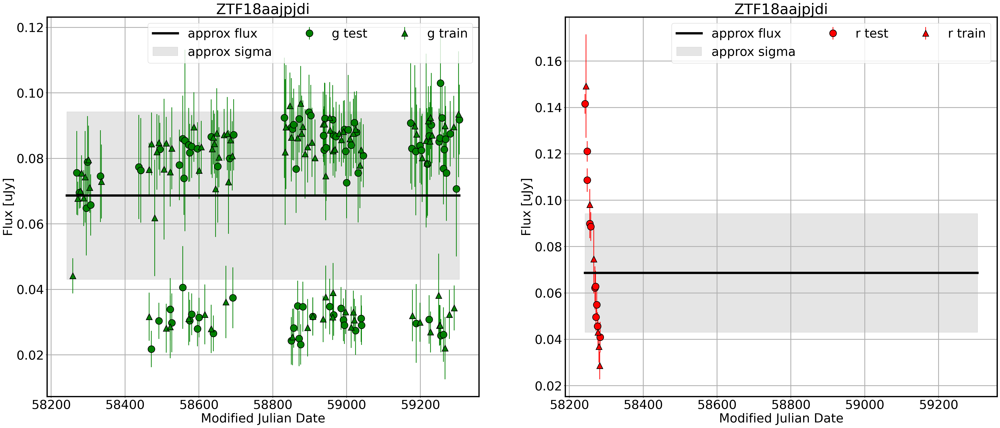

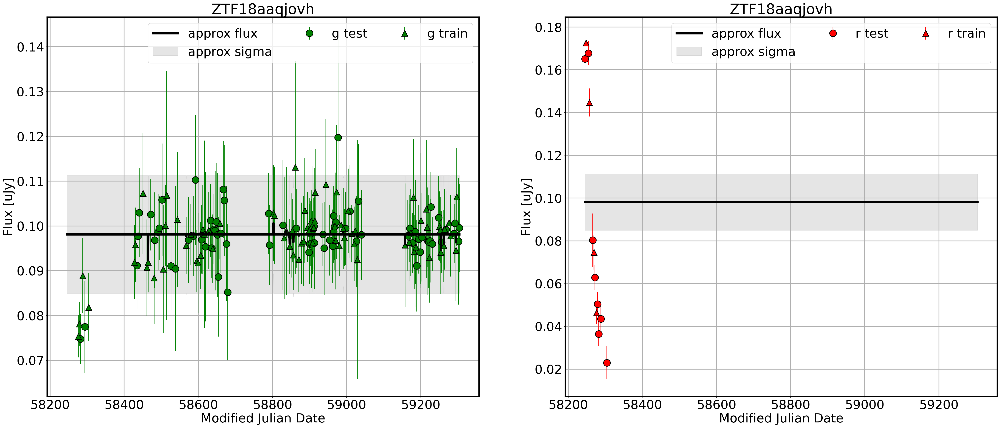

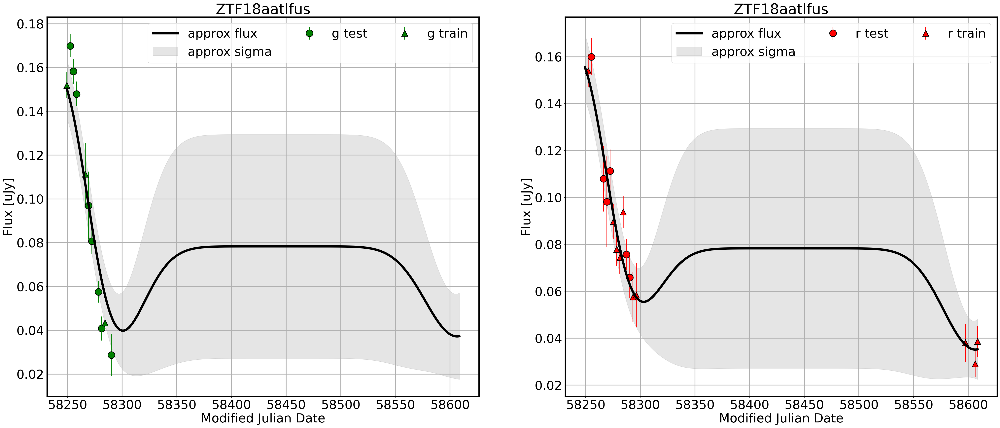

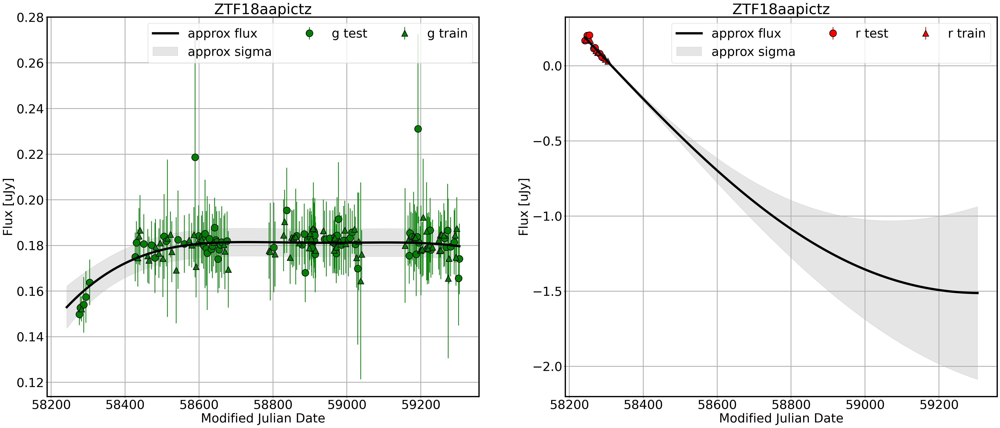

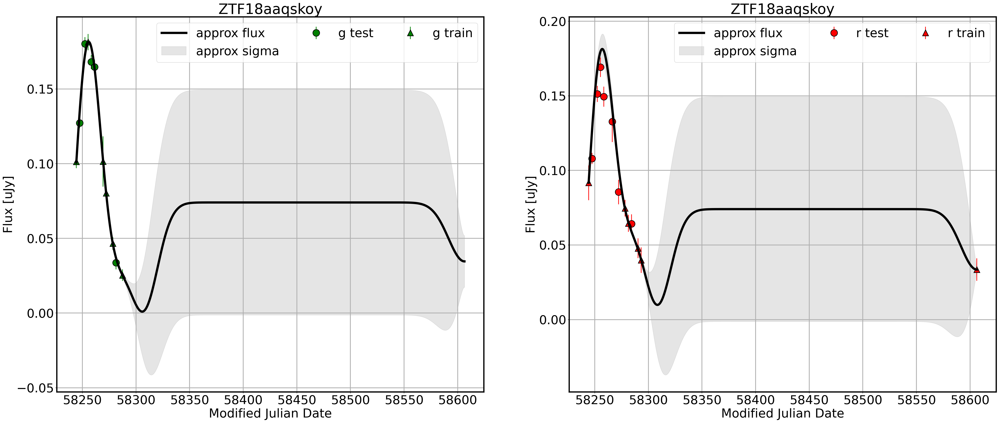

...

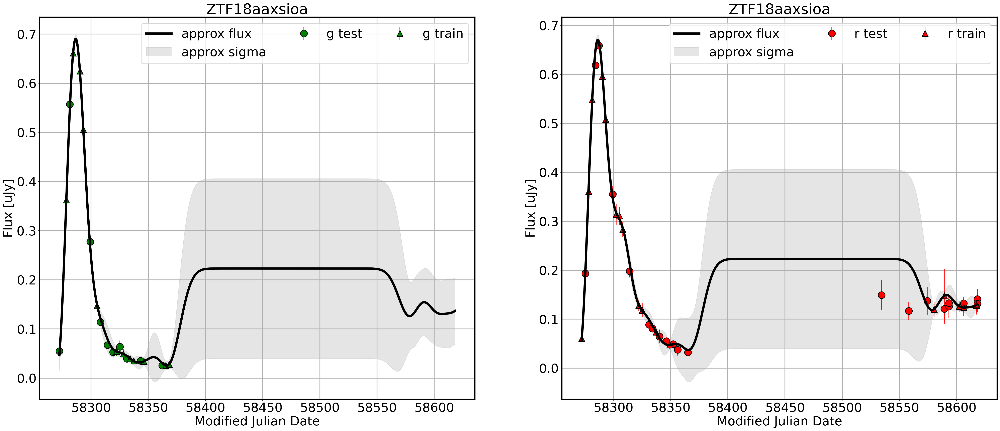

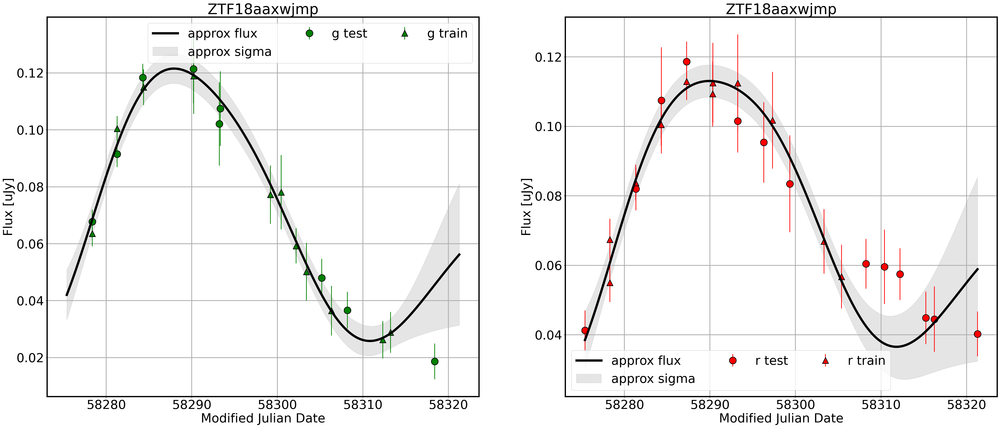

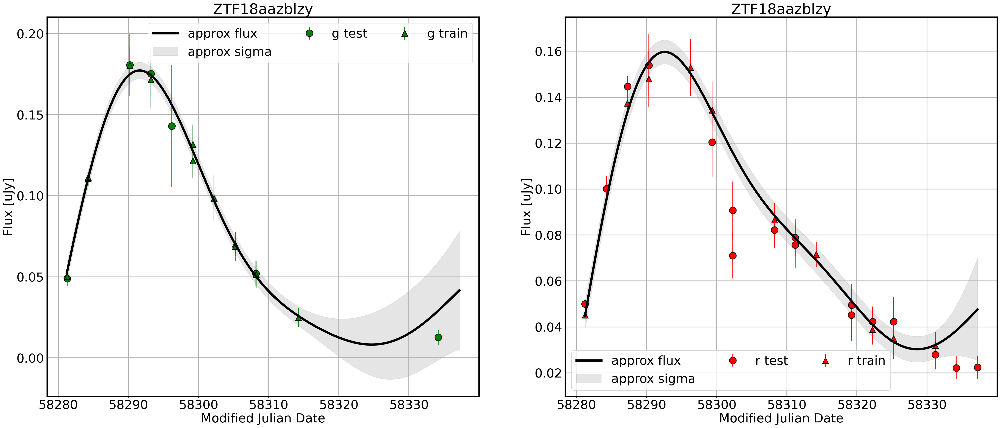

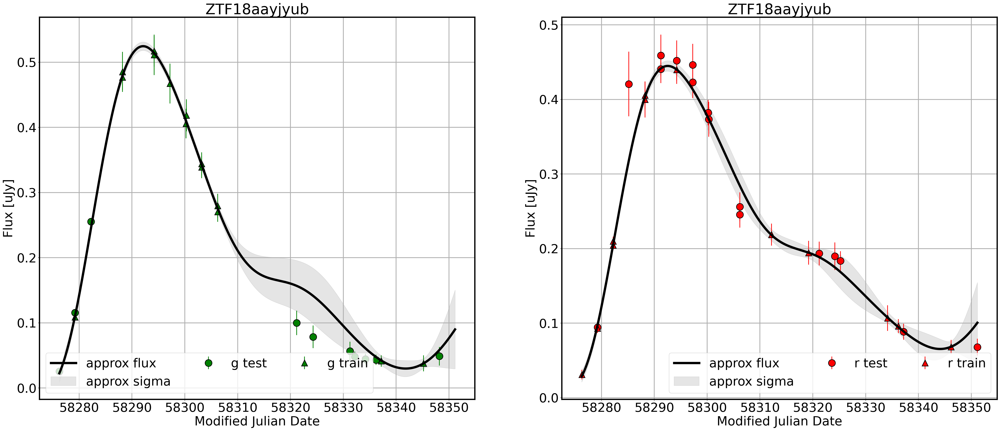

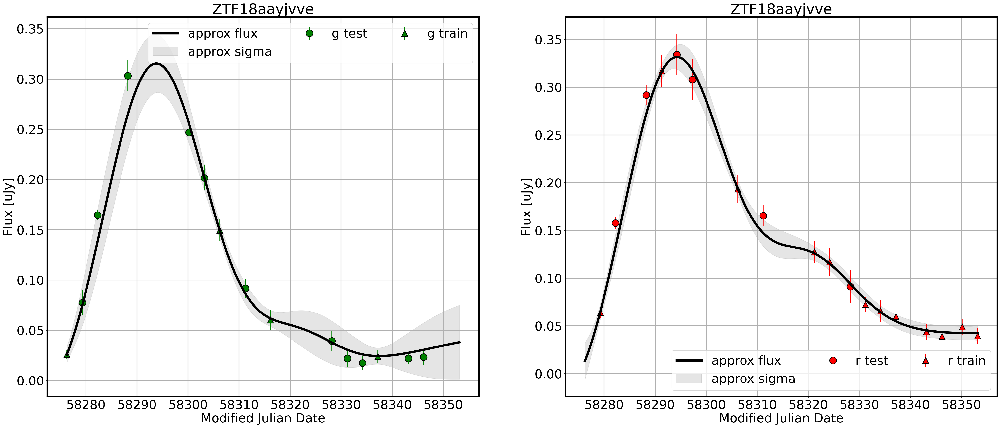

In [17]:
report = pd.DataFrame(columns=["ID", 'RMSE', 'MAE', 'RSE', 'RAE', 'MAPE'])


for name, i in tqdm(zip(new_bts_id[:20], range(len(new_bts_id[:20])))):
    fig = plt.figure(figsize=(35,35), dpi = 150)
    plt.rcParams.update({'font.size': 30})
    fig.subplots_adjust(left=0.07, right=0.98, top=0.95, bottom=0.15)
    ax1 = plt.subplot(2, 2, 1)
    ax2 = plt.subplot(2, 2, 2)

    ax1.spines['bottom'].set_linewidth(3)
    ax1.spines['top'].set_linewidth(3)
    ax1.spines['left'].set_linewidth(3)
    ax1.spines['right'].set_linewidth(3)
    
    ax2.spines['bottom'].set_linewidth(3)
    ax2.spines['top'].set_linewidth(3)
    ax2.spines['left'].set_linewidth(3)
    ax2.spines['right'].set_linewidth(3)
    
    anobject = get_object(data, name)
    if not is_good(anobject):
        continue

    obj_test, obj_test_pred, obj_aug, flux_pred, object_train = augum_gp(data, name)

    metrics = utils.regression_quality_metrics_report(obj_test['flux'].values, flux_pred)
    report.loc[len(report), :] = [i] + list(metrics)
    
    plot_light_curves_ax_band(obj_test, object_train, obj_aug, ax1, ax2, name)
    ax1.legend(loc='best', ncol=3, fontsize=30)
    ax2.legend(loc='best', ncol=3, fontsize=30)

    
for i in report.columns[1:].values:
    print('Среднее значение метрики ' + i + ' {}'.format(np.round(np.nanmean(report[i].values), 3)))
    print('Медианное значение метрики ' + i + ' {}'.format(np.round(np.median(report[i].values), 3)))
    print('Минимальное значение метрики ' + i + ' {}'.format(np.round(np.nanmin(report[i].values), 3)))
    print('Максимальное значение метрики ' + i + \
          ' {}'.format(np.round(np.nanmax(report[i].values), 3)), end='\n\n')

In [18]:
report = pd.DataFrame(columns=["ID", 'RMSE', 'MAE', 'RSE', 'RAE', 'MAPE'])


for name, i in tqdm(zip(new_bts_id, range(len(new_bts_id)))):
    anobject = get_object(data, name)
    if not is_good(anobject):
        continue

    obj_test, obj_test_pred, obj_aug, flux_pred, object_train = augum_gp(data, name)

    metrics = utils.regression_quality_metrics_report(obj_test['flux'].values, flux_pred)
    report.loc[len(report), :] = [i] + list(metrics)

    
for i in report.columns[1:].values:
    print('Среднее значение метрики ' + i + ' {}'.format(np.round(np.nanmean(report[i].values), 3)))
    print('Медианное значение метрики ' + i + ' {}'.format(np.round(np.median(report[i].values), 3)))
    print('Минимальное значение метрики ' + i + ' {}'.format(np.round(np.nanmin(report[i].values), 3)))
    print('Максимальное значение метрики ' + i + \
          ' {}'.format(np.round(np.nanmax(report[i].values), 3)), end='\n\n')

0it [00:00, ?it/s]

/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value found for "
/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value found for "
/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The opt

/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value found for "
/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value found for "
/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value f

/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value found for "
/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value found for "
/home/masha/.local/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value f

Среднее значение метрики RMSE 0.026
Медианное значение метрики RMSE 0.012
Минимальное значение метрики RMSE 0.003
Максимальное значение метрики RMSE 2.573

Среднее значение метрики MAE 0.017
Медианное значение метрики MAE 0.009
Минимальное значение метрики MAE 0.002
Максимальное значение метрики MAE 1.822

Среднее значение метрики RSE 0.296
Медианное значение метрики RSE 0.236
Минимальное значение метрики RSE 0.021
Максимальное значение метрики RSE 2.294

Среднее значение метрики RAE 0.252
Медианное значение метрики RAE 0.196
Минимальное значение метрики RAE 0.019
Максимальное значение метрики RAE 1.889

Среднее значение метрики MAPE 14.513
Медианное значение метрики MAPE 9.791
Минимальное значение метрики MAPE 2.147
Максимальное значение метрики MAPE 764.485

